<a href="https://colab.research.google.com/github/selyraa/2141720005-pcvk-2023/blob/main/week-13/Kuis_2_PCVK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Kuis 2 - PCVK

# Kelompok 5
1. Abdul Basith Bahi
2. Bagus Rezky Adhyaksa
3. Maulana Arif Wijaya
4. Muhammad Dzaka Murran Rusid
5. Sely Ruli Amanda

## Studi Kasus
Silakan mengerjakan pertanyaan di bawah ini dengan benar dan jujur.

1. Mengerjakan secara kelompok yang terdiri dari 5 anggota
2. Kumpulkan e-ktp anggota keluarga atau kelas pada kelompok minimal 5 buah sebagai dataset. 1 foto bisa berbagai pose ketika pengambilan foto e-ktp.
3. Deteksi dan kenali foto wajah e-ktp tersebut menggunakan metode yang telah dipelajari baik pada matakulilah PCVK ataupun matakuliah lain pada semester ini.
4. Presentasikan di depan kelas hasil dari pekerjaan kelompok Anda, paparkan hasil dari pekerjaan tersebut secara detail lengkap dengan tangkapan layar bagian dari; (1)pre-processing, (2)lokalisasi, (3)segmentasi, dan (4)pengenalan.
5. Jangan lupa upload juga kode program tersebut pada repository
6. Kumpulkan link file presentasi dalam bentuk pdf dan link repository.

Selamat mengerjaan, semua anggota kelompok wajib saling berkontribusi.

## Import Library

In [108]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from PIL import Image

## Load Drive

In [109]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [110]:
folder_path = '/content/drive/MyDrive/KTP_KEL5/BELUM CROP'

## Menampilkan Citra Original

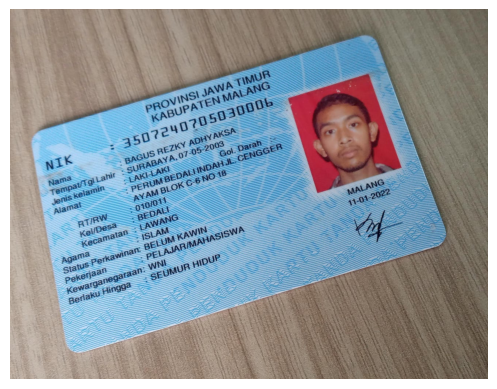

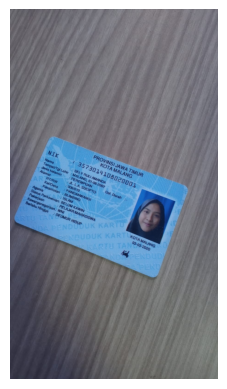

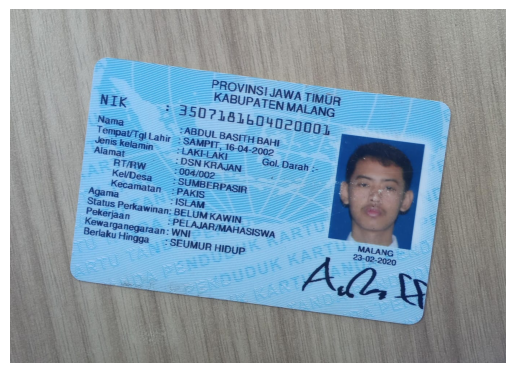

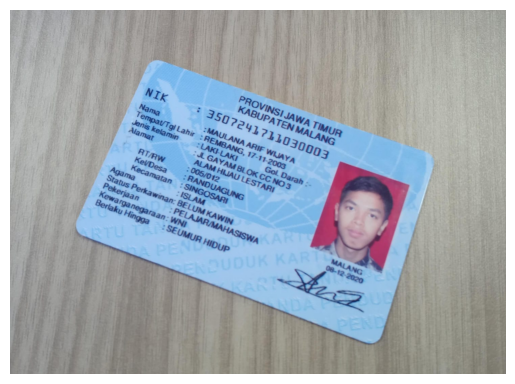

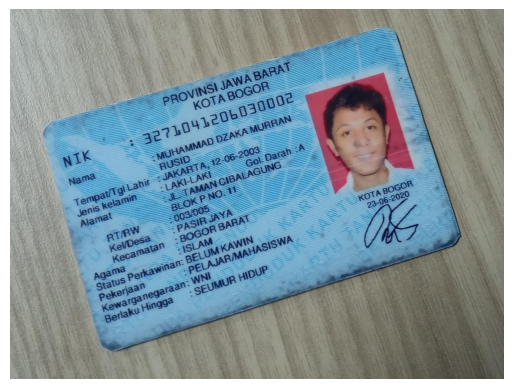

In [111]:
ktp_files = [file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

ktp_files = sorted(ktp_files)

# Iterasi pada gambar-gambar KTP
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    # Tampilkan gambar
    plt.figure()
    plt.axis('off')
    plt.imshow(cv2.cvtColor(ktp_image, cv2.COLOR_BGR2RGB))
    plt.show()

## Pre-processing

In [112]:
def detect_cards(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.blur(gray, (7, 7))
    lt = 900
    edged = cv2.Canny(gray, lt, lt * 3)
    # (_, cnts, _) = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    # cnts = sorted(cnts, key = cv2.contourArea, reverse = True)
    # new_cnts = []
    # for cnt in cnts:
    #     peri = cv2.arcLength(cnt, True)
    #     approx_corners = cv2.approxPolyDP(cnt, 0.02 * peri, True)
    #     if len(approx_corners) == 4:
    #         new_cnts.append(cnt)
    return edged

def proccess_card(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

    return image

def order_points(pts):
  rect = np.zeros((4, 2), dtype = "float32")
  s = pts.sum(axis = 1)
  rect[0] = pts[np.argmin(s)]
  rect[2] = pts[np.argmax(s)]
  diff = np.diff(pts, axis = 1)
  rect[1] = pts[np.argmin(diff)]
  rect[3] = pts[np.argmax(diff)]
  return rect

def four_point_transform(image, pts):
  rect = order_points(pts)
  (tl, tr, br, bl) = rect
  widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
  widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
  maxWidth = max(int(widthA), int(widthB))
  heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
  heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
  maxHeight = max(int(heightA), int(heightB))
  dst = np.array([
    [0, 0],
    [maxWidth - 1, 0],
    [maxWidth - 1, maxHeight - 1],
    [0, maxHeight - 1]], dtype = "float32")
  M = cv2.getPerspectiveTransform(rect, dst)
  warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
  return warped

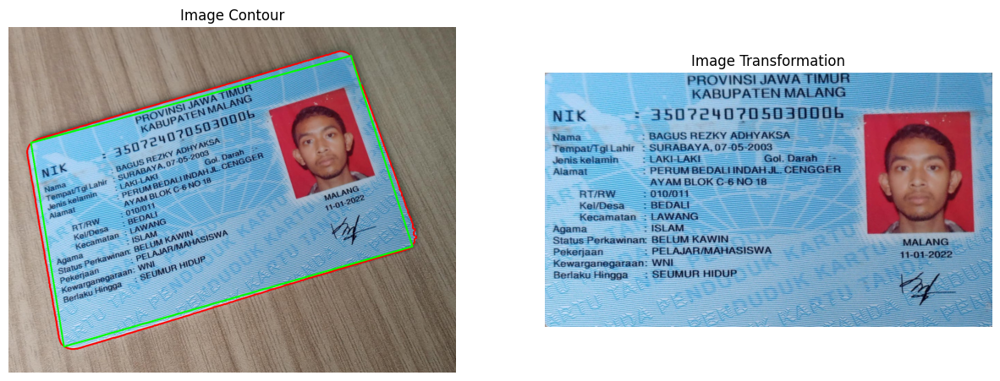

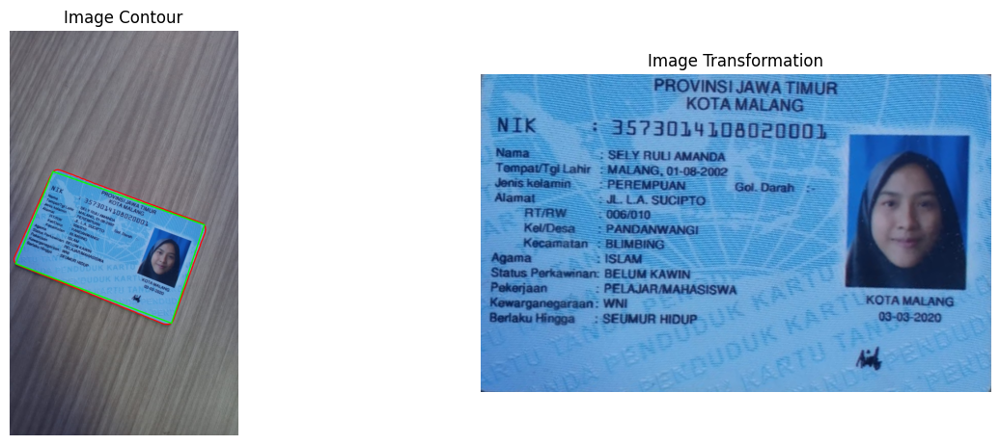

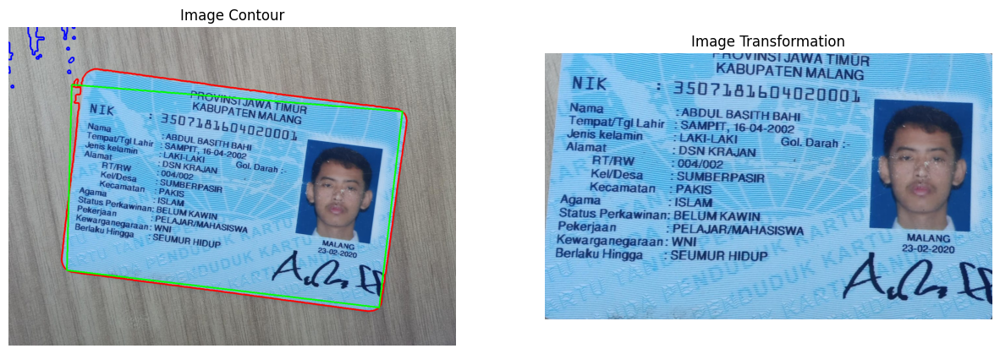

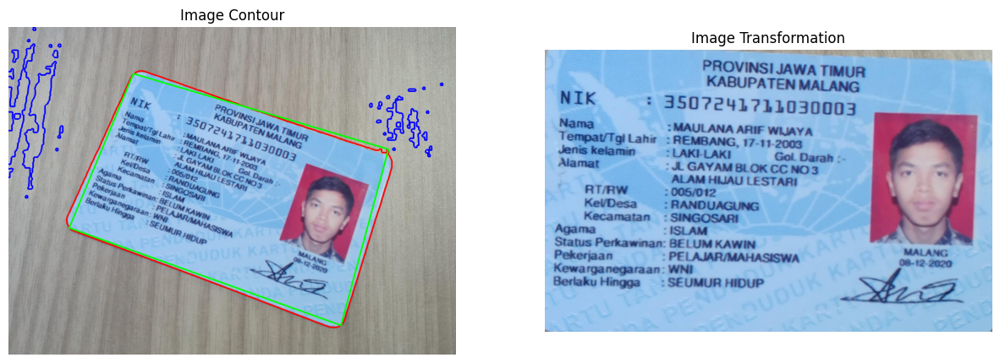

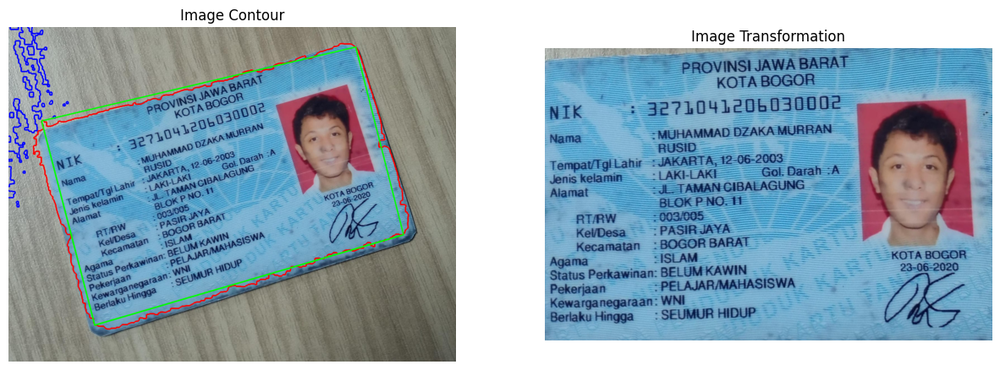

In [113]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

src = None
erosion_size = 0
max_elem = 2
max_kernel_size = 21
title_trackbar_element_shape = 'Element:\n 0: Rect \n 1: Cross \n 2: Ellipse'
title_trackbar_kernel_size = 'Kernel size:\n 2n +1'
title_erosion_window = 'Erosion Demo'
title_dilation_window = 'Dilation Demo'

cropped_images = []


# Iterasi pada gambar-gambar KTP
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    blur = cv2.blur(ktp_image, (5,5))

    _, mask = cv2.threshold(blur, 180, 255, cv2.THRESH_BINARY)

    mask[:,:,1] = 0;
    mask[:,:,2] = 0;

    lt = 50
    edges = cv2.Canny(mask, lt, lt * 3)

    kernel = np.ones((5, 5), np.uint8)

    dilatation_dst = cv2.dilate(edges, kernel , iterations=4)
    erosion = cv2.erode(dilatation_dst,kernel,iterations = 3)

    # # Deteksi tepi menggunakan Canny
    edges = cv2.Canny(erosion, 50, 150)

    # cv2.drawContours(ktp_test, contours, -1, (0, 0, 255), 2)
    # cv2_imshow(ktp_test)

    contours, img = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    image_contour = ktp_image.copy()

    # # Initialize variables to store the largest rectangle
    max_area = 0
    best_rect = None

    # Loop through each contour
    for contour in contours:
        # Approximate the contour to a polygon
        epsilon = 0.02 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)

        # Check if the polygon has 4 vertices (rectangle)
        if len(approx) == 4:
            # Calculate the area of the rectangle
            area = cv2.contourArea(approx)

            # Update the largest rectangle if the current one is bigger
            if area > max_area:
                max_area = area
                best_rect = approx

    areas = [cv2.contourArea(c) for c in contours]
    max_index = np.argmax(areas)

    cv2.drawContours(image_contour, contours, -1, (255, 0, 0), 4)
    cv2.drawContours(image_contour, [contours[max_index]], -1, (0, 0, 255), 4)
    cv2.drawContours(image_contour, [best_rect], -1, (0, 255, 0), 4)

    warped = four_point_transform(ktp_image, best_rect.reshape(4, 2))

    plt.figure(figsize=(15, 12))

    plt.subplot(2, 2, 1)
    plt.imshow(cv2.cvtColor(image_contour, cv2.COLOR_BGR2RGB))
    plt.title('Image Contour')
    plt.axis('off')

    # cv2_imshow(image_contour)
    plt.subplot(2, 2, 2)
    plt.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    plt.title('Image Transformation')
    plt.axis('off')
    # cv2_imshow(warped)

    cropped_images.append(warped)


## Load Face Cascade

In [114]:
cascade_wajah = cv2.CascadeClassifier('/content/drive/MyDrive/Semester5/PCVK/Images/haarcascades/haarcascade_frontalface_alt.xml')

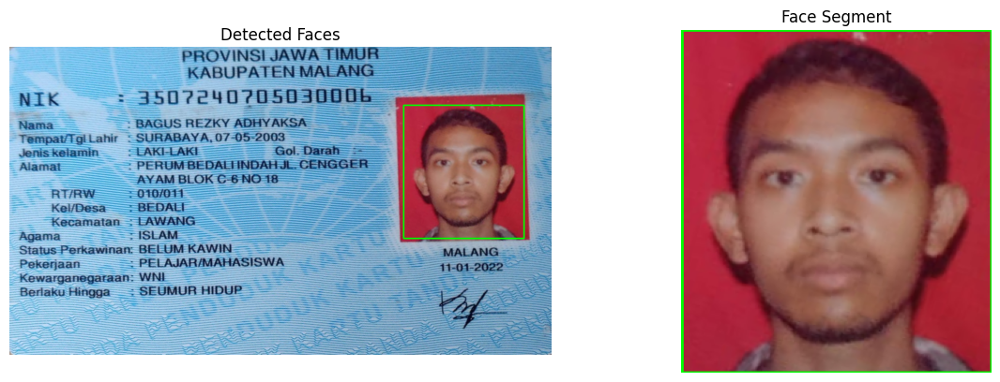

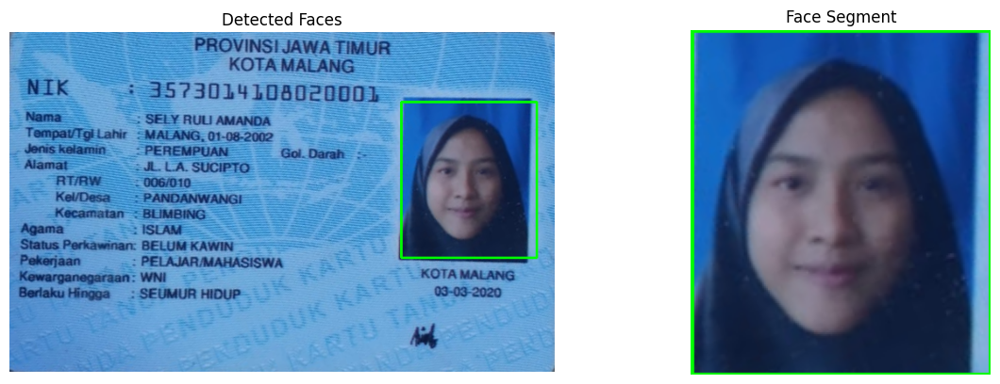

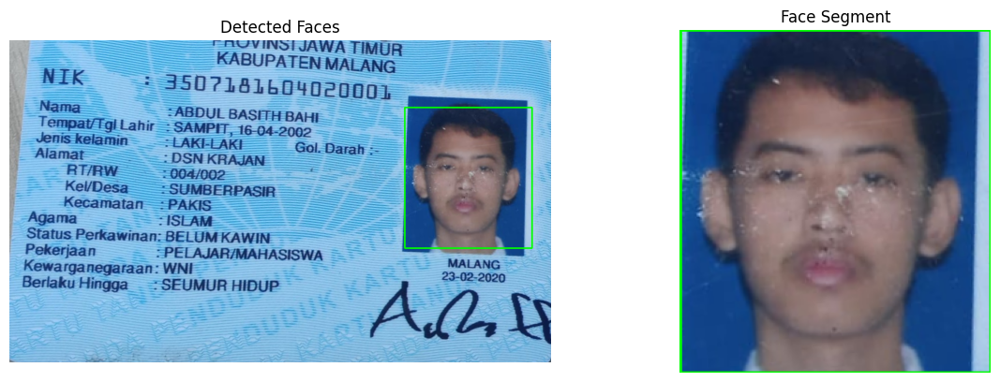

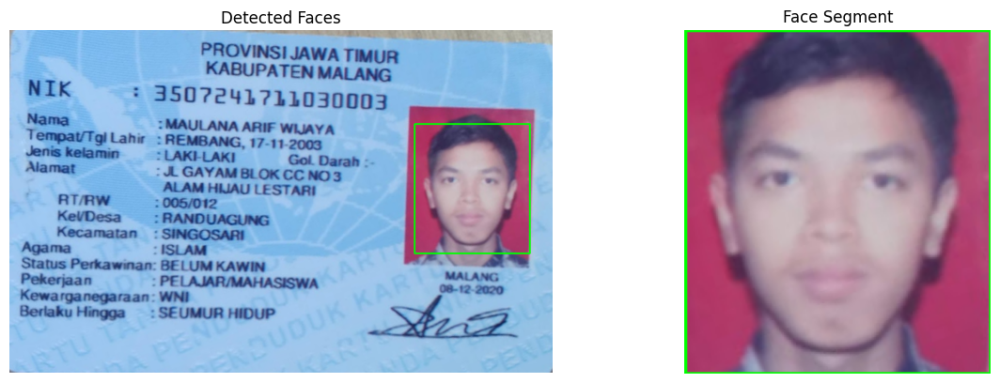

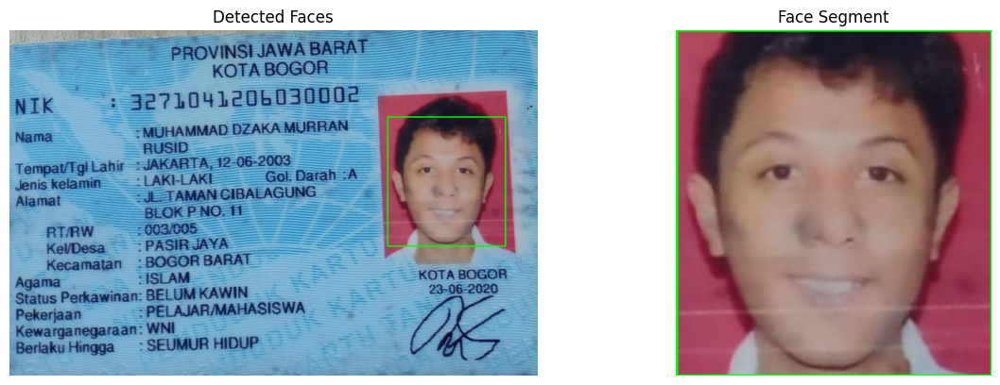

In [115]:
face_detection = []

for img in cropped_images:

  roi_wajah = cascade_wajah.detectMultiScale(img)

  (x, y, w, h) = roi_wajah[0]

  cv2.rectangle(img, (x - 20, y - 40), (x + w + 30, y + h + 35), (0, 255, 0), 2)
  face_det = img.copy()
  face_segment = face_det[y - 40:y + h + 35, x - 20:x + w + 30]

  plt.figure(figsize=(12, 8))

  plt.subplot(2, 2, 1)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.title('Detected Faces')
  plt.axis('off')

  plt.subplot(2, 2, 2)
  plt.imshow(cv2.cvtColor(face_segment, cv2.COLOR_BGR2RGB))
  plt.title('Face Segment')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

  face_detection.append(face_segment)

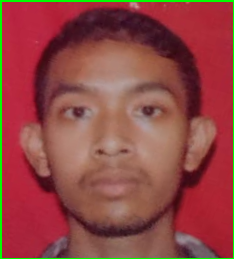

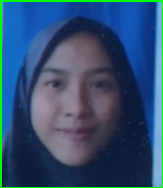

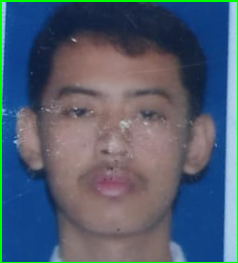

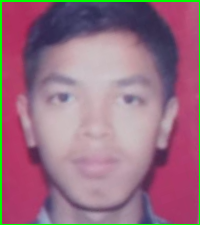

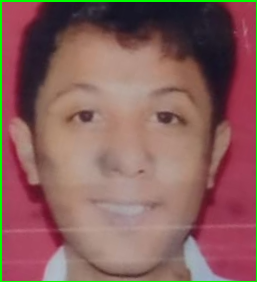

In [116]:
for img_path in face_detection:
    image = cv2_imshow(img_path)

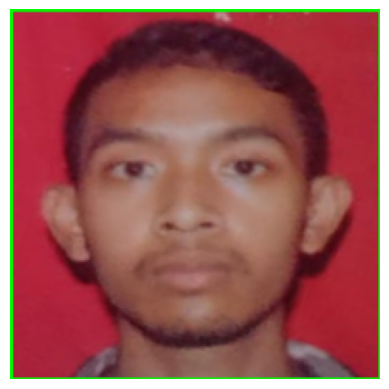

1/1 [==============================] - 1s 562ms/step
[[0.03171506 0.07966032 0.00270618 0.25706458 0.62885386]]
Class: Basith
Confidence Score: 63 %



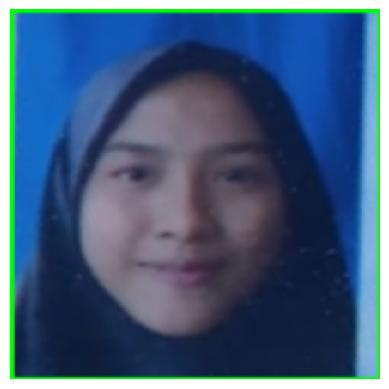

1/1 [==============================] - 0s 23ms/step
[[0.01902941 0.01065546 0.5990745  0.00102141 0.37021926]]
Class: Sely
Confidence Score: 60 %



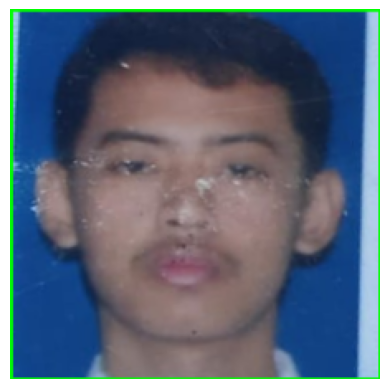

1/1 [==============================] - 0s 23ms/step
[[0.0001545  0.00268466 0.00003565 0.00016216 0.99696296]]
Class: Basith
Confidence Score: 100 %



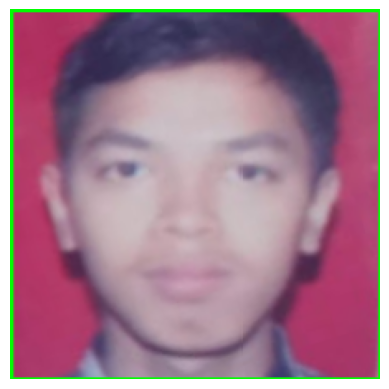

1/1 [==============================] - 0s 23ms/step
[[0.00092336 0.09421617 0.04612521 0.8337324  0.02500277]]
Class: Dzaka
Confidence Score: 83 %



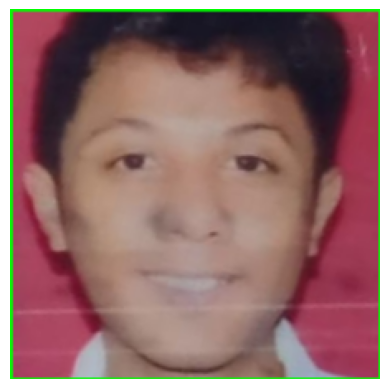

1/1 [==============================] - 0s 35ms/step
[[0.00343164 0.23908742 0.00061205 0.64080334 0.11606553]]
Class: Dzaka
Confidence Score: 64 %



In [117]:
from keras.models import load_model
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Disable scientific notation for clarity
np.set_printoptions(suppress=True)

# Load the model
model = load_model("/content/drive/MyDrive/KTP_KEL5/converted_keras/keras_model.h5", compile=False)

# Load the labels
class_names = open("/content/drive/MyDrive/KTP_KEL5/converted_keras/labels.txt", "r").readlines()

for face_segment in face_detection:
    # # Convert the image to RGB
    image = cv2.cvtColor(face_segment, cv2.COLOR_BGR2RGB)

    # Resize the image
    image = cv2.resize(image, (224, 224), interpolation=cv2.INTER_AREA)

    # Show the image
    plt.imshow(image)
    # plt.title(class_name[1:])
    plt.axis('off')
    plt.show()

    # Preprocess the image for the model
    image = np.asarray(image, dtype=np.float32).reshape(1, 224, 224, 3)
    image = (image / 127.5) - 1

    # Predict using the model
    prediction = model.predict(image)

    print(prediction)
    index = np.argmax(prediction)
    class_name = class_names[index]
    confidence_score = prediction[0][index]

    # Print prediction and confidence score
    print("Class:", class_name[2:], end="")
    print("Confidence Score:", str(np.round(confidence_score * 100))[:-2], "%\n")
